# LIBRARIES

In [ ]:
# !pip install nibabel

In [1]:
# 일반
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%config InlineBackend.figure_format='retina'
import matplotlib as mpl
import random
import time

# 경로 처리
import os
import os.path
from pathlib import Path
import glob
from scipy.io import loadmat
import nibabel as nib
import csv

# 이미지 처리
from PIL import Image
from keras.preprocessing.image import ImageDataGenerator
import cv2
# from keras.applications.vgg16 import preprocessing_input,decode_predictions
from keras.preprocessing import image
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from scipy.ndimage.filters import convolve
from skimage import data, io, filters
import skimage
from skimage.morphology import convex_hull_image, erosion
from IPython import display
from scipy.ndimage import gaussian_filter
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.patches as patches

# scaler & transformation
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from keras.utils.np_utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder

# 정확도 조정
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score

# optimizer
from keras.optimizers import RMSprop, Adam, Optimizer, SGD

# model layers
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization,MaxPooling2D,BatchNormalization,\
                        Permute, TimeDistributed, Bidirectional,GRU, SimpleRNN,\
LSTM, GlobalAveragePooling2D, SeparableConv2D, ZeroPadding2D, Convolution2D, ZeroPadding2D,Reshape, Conv2DTranspose,\
LeakyReLU, GaussianNoise, GlobalMaxPooling2D, ReLU, Input, Concatenate
from keras import models
from keras import layers
import tensorflow as tf
from keras.applications import VGG16, VGG19, inception_v3
from keras import backend as K
from keras.utils import plot_model
from keras.datasets import mnist
import keras
from keras.models import Model

# warnings 무시
from warnings import filterwarnings
filterwarnings('ignore', category=DeprecationWarning)
filterwarnings('ignore', category=FutureWarning)
filterwarnings('ignore', category=UserWarning)

# OBSERVATION SET AND OVERVIEW

In [2]:
# !unzip 'MRI Hippocampus.zip'

MAIN PATH

In [3]:
Label35_Path = Path("label/35label")
Image35_Path = Path("original/35")

JPG PATH

In [4]:
Label_Path = list(Label35_Path.glob(r"**/*.jpg"))
Image_Path = list(Image35_Path.glob(r"**/*.jpg"))

In [5]:
print("LABEL LEN:",len(Label_Path))
print("---"*10)
print("IMAGE LEN:",len(Image_Path))

LABEL LEN: 13230
------------------------------
IMAGE LEN: 6615


TO SERIES

In [6]:
Label_Series = pd.Series(Label_Path,name="LABEL").astype(str)
Image_Series = pd.Series(Image_Path,name="IMAGE").astype(str)

In [7]:
Label_Series = Label_Series.sort_values().reset_index(drop=True)
Image_Series = Image_Series.sort_values().reset_index(drop=True)

In [8]:
print("LABEL LEN:",len(Label_Series))
print("---"*10)
print("IMAGE LEN:",len(Image_Series))

LABEL LEN: 13230
------------------------------
IMAGE LEN: 6615


In [9]:
print("LABEL PATH LEN:",len(Label_Series[0]))
print("---"*10)
print("IMAGE PATH LEN:",len(Image_Series[0]))

LABEL PATH LEN: 91
------------------------------
IMAGE PATH LEN: 87


In [10]:
print("LABEL PATH EXAMPLE:\n",Label_Series[0])
print("LABEL PATH EXAMPLE:\n",Label_Series[6614])
print("---"*10)
print("IMAGE PATH EXAMPLE:\n",Image_Series[0])
print("IMAGE PATH EXAMPLE:\n",Image_Series[6614])

LABEL PATH EXAMPLE:
 label/35label/ADNI_002_S_0685_18211/ADNI_002_S_0685_18211_L/ADNI_002_S_0685_18211_L_001.jpg
LABEL PATH EXAMPLE:
 label/35label/ADNI_023_S_0061_132164_ACPC/ADNI_023_S_0061_132164_L/ADNI_023_S_0061_132164_L_189.jpg
------------------------------
IMAGE PATH EXAMPLE:
 original/35/ADNI_002_S_0685_18211_tal_noscale/ADNI_002_S_0685_18211_tal_noscale_001.jpg
IMAGE PATH EXAMPLE:
 original/35/ADNI_136_S_0429_109839_ACPC/ADNI_136_S_0429_109839_ACPC_189.jpg


SPLITTING PROCESS

STEP 1

In [11]:
Split_Params_For_LABEL = "35label/"
Split_Params_For_IMG = "35/"

L_Main_Path,L_Target_Path = Label_Series[0].split(Split_Params_For_LABEL)
I_Main_Path,I_Target_Path = Image_Series[0].split(Split_Params_For_IMG)

print("LABEL MAIN: ",L_Main_Path)
print("LABEL TARGET: ",L_Target_Path)
print("---"*20)
print("IMG MAIN: ",I_Main_Path)
print("IMG TARGET: ",I_Target_Path)

LABEL MAIN:  label/
LABEL TARGET:  ADNI_002_S_0685_18211/ADNI_002_S_0685_18211_L/ADNI_002_S_0685_18211_L_001.jpg
------------------------------------------------------------
IMG MAIN:  original/
IMG TARGET:  ADNI_002_S_0685_18211_tal_noscale/ADNI_002_S_0685_18211_tal_noscale_001.jpg


STEP 2

In [12]:
Common_Params = "/"

Label_Path_Before,Label_Path_Middle,Label_Path_After = L_Target_Path.split(Common_Params)
IMG_Path_Before,IMG_Path_After = I_Target_Path.split(Common_Params)

print("LABEL BEFORE: ",Label_Path_Before)
print("LABEL MIDDLE: ",Label_Path_Middle)
print("LABEL AFTER: ",Label_Path_After)
print("---"*20)
print("IMG BEFORE: ",IMG_Path_Before)
print("IMG AFTER: ",IMG_Path_After)

LABEL BEFORE:  ADNI_002_S_0685_18211
LABEL MIDDLE:  ADNI_002_S_0685_18211_L
LABEL AFTER:  ADNI_002_S_0685_18211_L_001.jpg
------------------------------------------------------------
IMG BEFORE:  ADNI_002_S_0685_18211_tal_noscale
IMG AFTER:  ADNI_002_S_0685_18211_tal_noscale_001.jpg


STEP 3

In [13]:
List_Split_Params = "_"

Label_Path_Split = Label_Path_After.split(List_Split_Params)
IMG_Path_Split = IMG_Path_After.split(List_Split_Params)

print("LABEL LIST: ",Label_Path_Split)
print("IMG LIST: ",IMG_Path_Split)
print("---"*20)
print("LABEL TARGET: ",Label_Path_Split[-2])
print("IMG TARGET: ",IMG_Path_Split[-1])

LABEL LIST:  ['ADNI', '002', 'S', '0685', '18211', 'L', '001.jpg']
IMG LIST:  ['ADNI', '002', 'S', '0685', '18211', 'tal', 'noscale', '001.jpg']
------------------------------------------------------------
LABEL TARGET:  L
IMG TARGET:  001.jpg


STEP 4

In [14]:
if Label_Path_Split[-2] == "L":
    
    print("IT'S LEFT")
            
elif Label_Path_Split[-2] == "R":
     
    print("IT'S RIGHT")

IT'S LEFT


SPLITTING

In [15]:
L_IMG = []
R_IMG = []

Total_IMG = []

Split_Params_For_LABEL = "35label/"
Split_Params_For_IMG = "35/"

Common_Params = "/"

List_Split_Params = "_"


for label_x,image_x in zip(Label_Series,Image_Series):
    
    try:
        
        L_Main_Path,L_Target_Path = label_x.split(Split_Params_For_LABEL)
        I_Main_Path,I_Target_Path = image_x.split(Split_Params_For_IMG)

        Label_Path_Before,Label_Path_Middle,Label_Path_After = L_Target_Path.split(Common_Params)
        IMG_Path_Before,IMG_Path_After = I_Target_Path.split(Common_Params)

        Label_Path_Split = Label_Path_After.split(List_Split_Params)
        IMG_Path_Split = IMG_Path_After.split(List_Split_Params)


        if Label_Path_Split[-2] == "L":

            L_IMG.append(label_x)
            Total_IMG.append(image_x)
            
        elif Label_Path_Split[-2] == "R":
            
            Total_IMG.append(image_x)
            R_IMG.append(label_x)
            
        else:
            print("SOMETHING IS WRONG!")
            
    except:
        print("LABEL: ",label_x)
        print("IMG: ",image_x)

In [16]:
print("IMG :",len(Total_IMG))
print("LABEL L:",len(L_IMG))
print("LABEL R:",len(R_IMG))

IMG : 6615
LABEL L: 3402
LABEL R: 3213


In [17]:
Sort_L = sorted(L_IMG)
Sort_R = sorted(R_IMG)
Sort_IMG = sorted(Total_IMG)

In [18]:
print(Sort_L[0])
print(Sort_R[0])
print(Sort_IMG[0])

label/35label/ADNI_002_S_0685_18211/ADNI_002_S_0685_18211_L/ADNI_002_S_0685_18211_L_001.jpg
label/35label/ADNI_002_S_0685_18211/ADNI_002_S_0685_18211_R/ADNI_002_S_0685_18211_R_001.jpg
original/35/ADNI_002_S_0685_18211_tal_noscale/ADNI_002_S_0685_18211_tal_noscale_001.jpg


CHECKING FOR NO HIPPOCAMPUS OR HIPPOCAMPUS

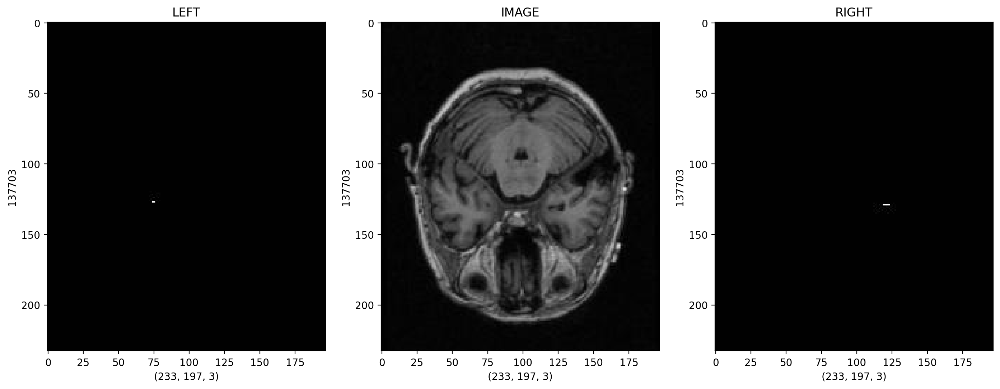

In [19]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[988]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[988]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[988]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

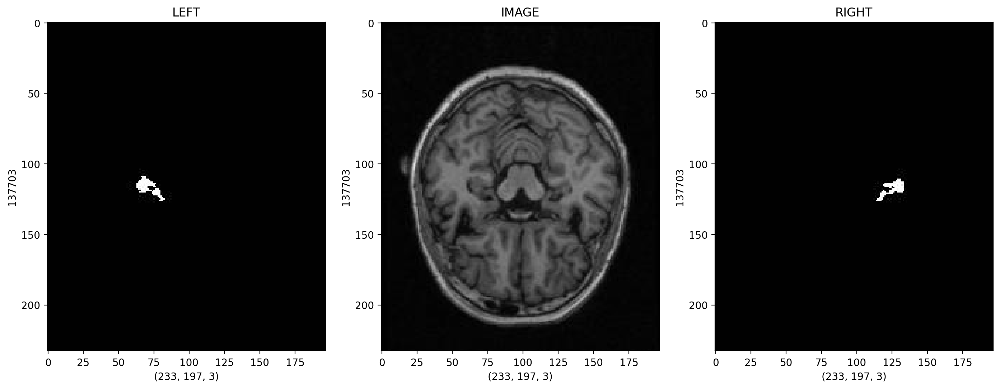

In [20]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1000]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1000]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1000]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

MRI ROUND

<function matplotlib.pyplot.show(close=None, block=None)>

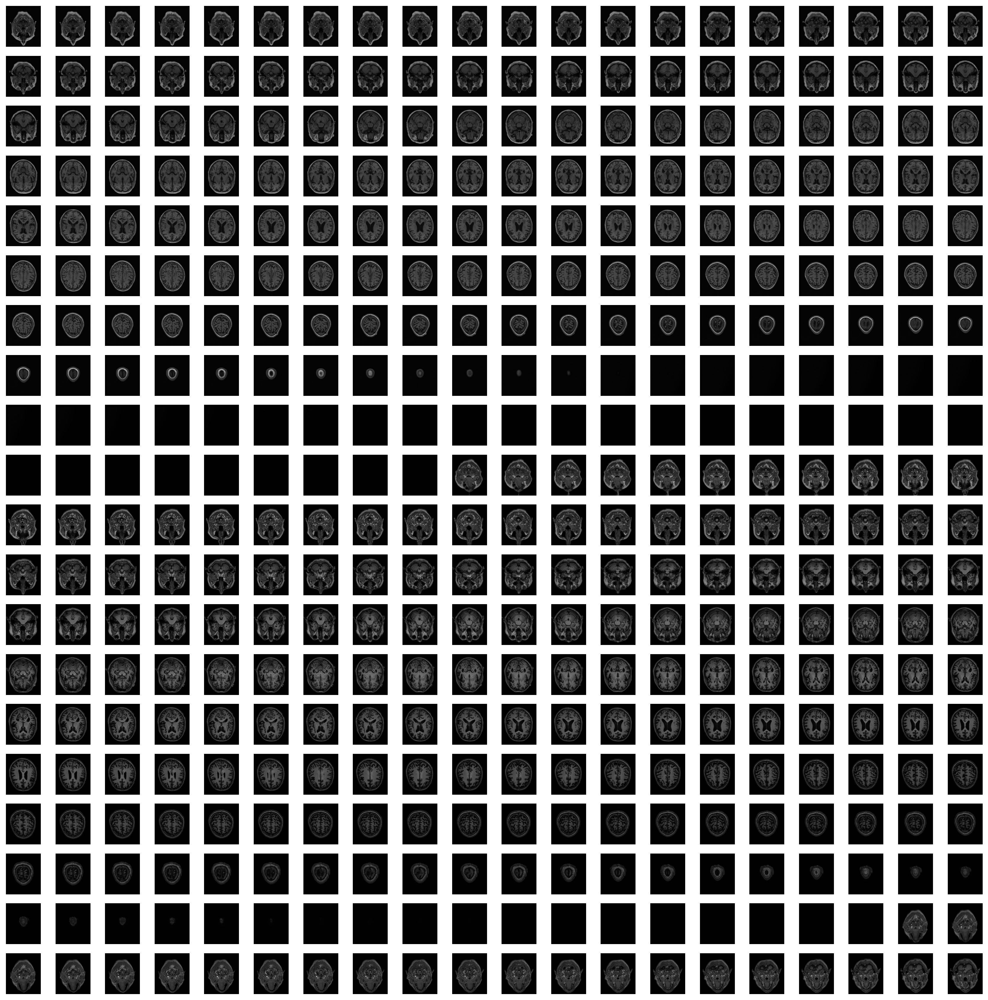

In [21]:
figure,axis = plt.subplots(20,20,figsize=(17,17))

for indexing,operations in enumerate(axis.flat):
    
    Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[indexing]),cv2.COLOR_BGR2RGB)
    
    operations.imshow(Example_IMG)
    operations.axis("off")

plt.tight_layout()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

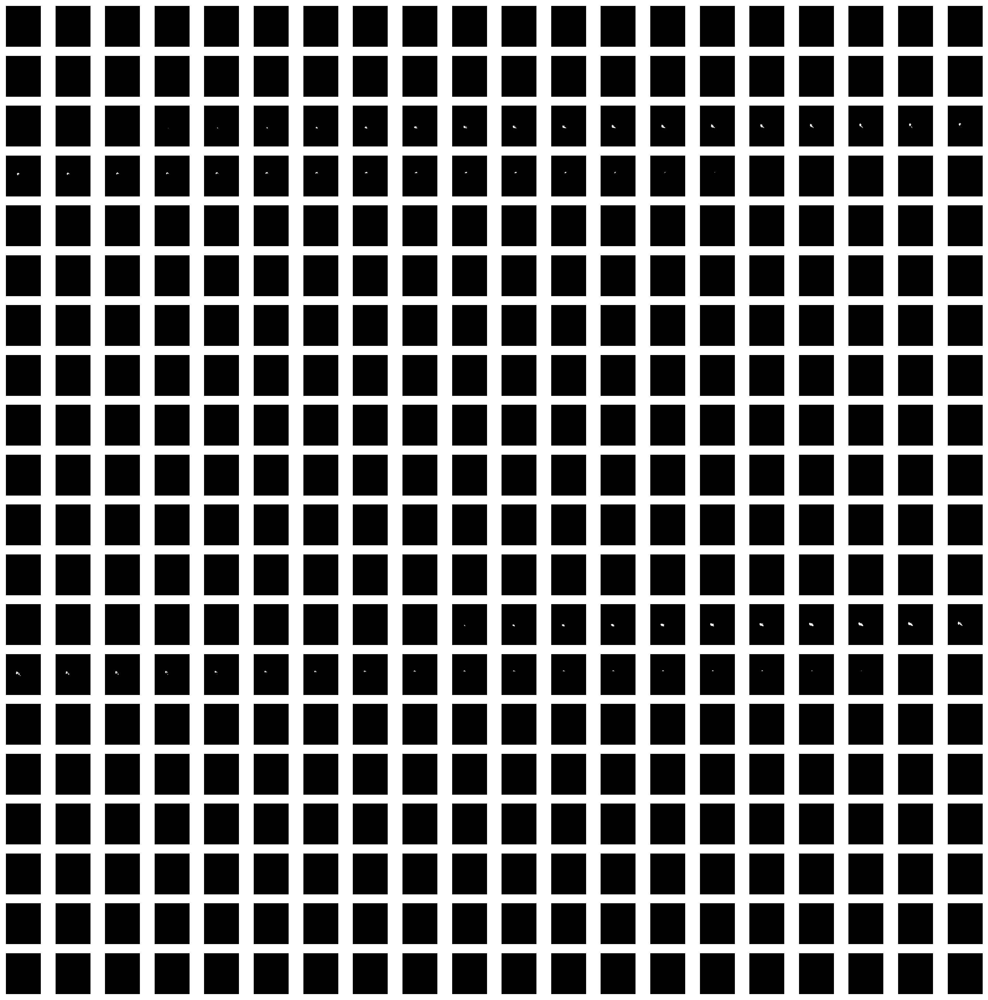

In [22]:
figure,axis = plt.subplots(20,20,figsize=(17,17))

for indexing,operations in enumerate(axis.flat):
    
    Example_IMG = cv2.cvtColor(cv2.imread(Sort_L[indexing]),cv2.COLOR_BGR2RGB)
    
    operations.imshow(Example_IMG)
    operations.axis("off")

plt.tight_layout()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

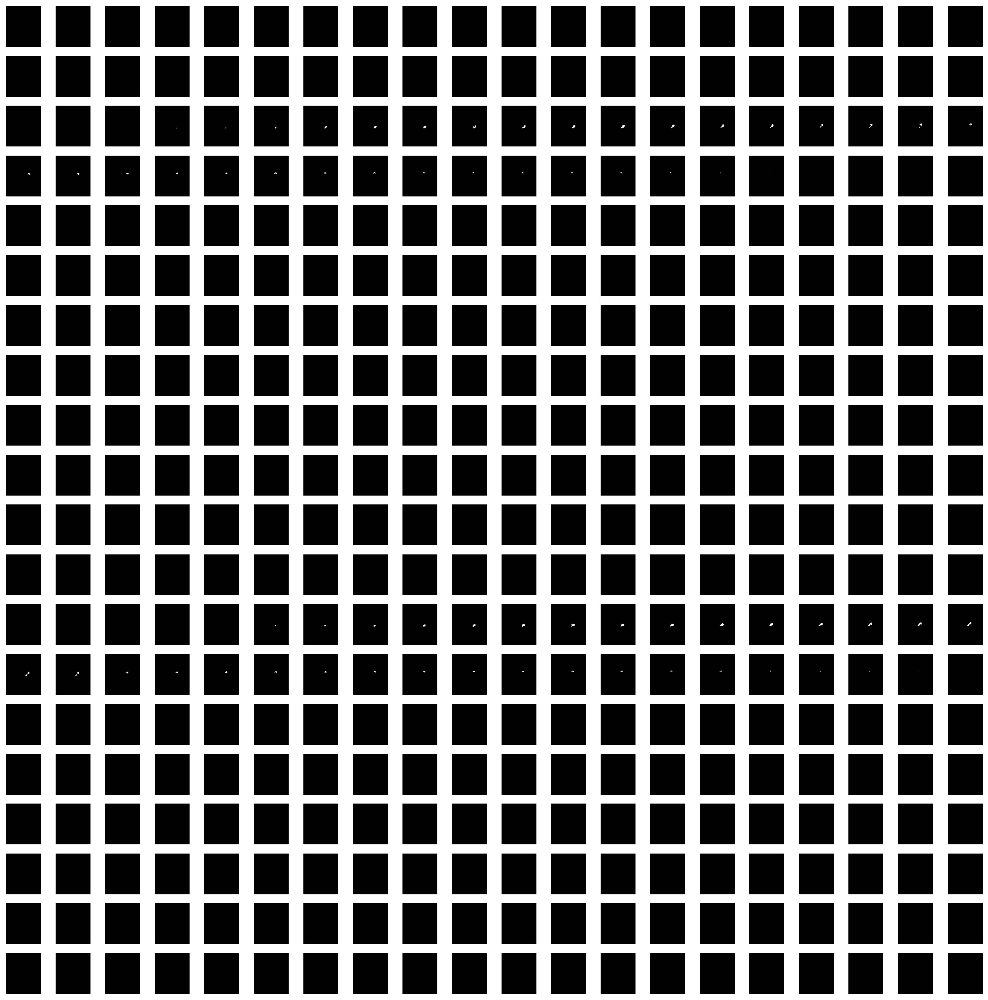

In [23]:
figure,axis = plt.subplots(20,20,figsize=(17,17))

for indexing,operations in enumerate(axis.flat):
    
    Example_IMG = cv2.cvtColor(cv2.imread(Sort_R[indexing]),cv2.COLOR_BGR2RGB)
    
    operations.imshow(Example_IMG)
    operations.axis("off")

plt.tight_layout()
plt.show

HIPPOCAMPUS CONCAT

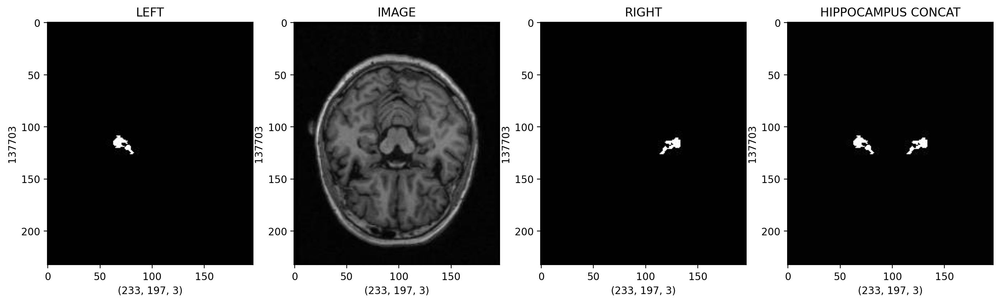

In [24]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1000]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1000]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1000]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.5)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Hıppocampus_Concat.shape)
axis[3].set_ylabel(Hıppocampus_Concat.size)
axis[3].set_title("HIPPOCAMPUS CONCAT")
axis[3].imshow(Hıppocampus_Concat)

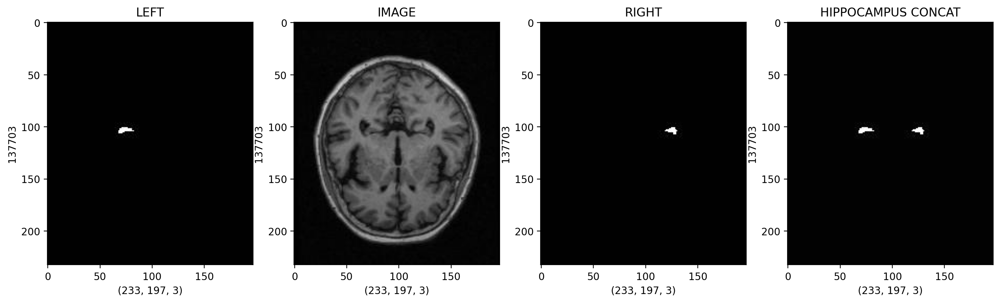

In [25]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1010]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1010]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1010]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.5)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Hıppocampus_Concat.shape)
axis[3].set_ylabel(Hıppocampus_Concat.size)
axis[3].set_title("HIPPOCAMPUS CONCAT")
axis[3].imshow(Hıppocampus_Concat)

IMAGE AND HIPPOCAMPUS CONCAT

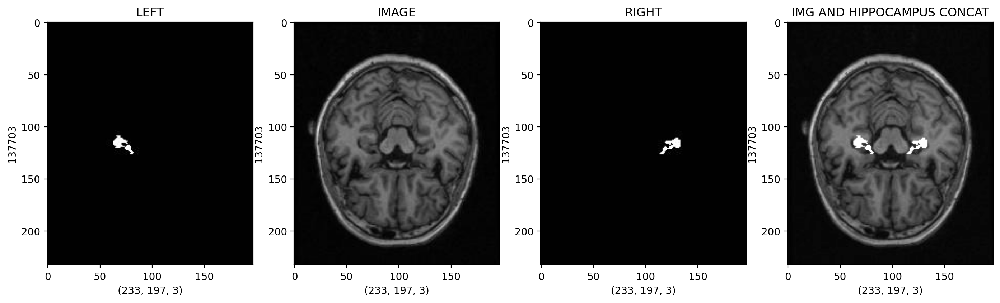

In [26]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1000]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1000]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1000]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Main_Concat = cv2.addWeighted(Example_IMG,1,Hıppocampus_Concat,1,0.5)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Main_Concat.shape)
axis[3].set_ylabel(Main_Concat.size)
axis[3].set_title("IMG AND HIPPOCAMPUS CONCAT")
axis[3].imshow(Main_Concat)

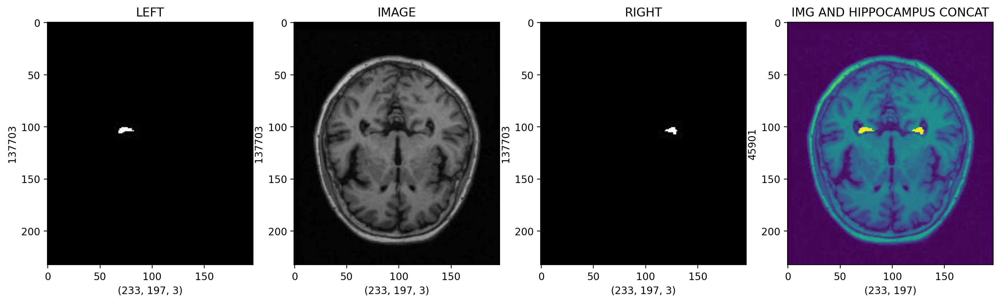

In [27]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1010]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1010]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1010]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Main_Concat = cv2.addWeighted(Example_IMG[:,:,0],1,Hıppocampus_Concat[:,:,0],1,0.2)
# Example_IMG[:,:,0] 와 Hıppocampus_Concat[:,:,0] 에서 R(Red) 채널 값이 합쳐진 결과가 나오게 되는데
# 노란색(빨강+녹색)과 보라색(빨강+파랑)으로 나오게 됩니다.
axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Main_Concat.shape)
axis[3].set_ylabel(Main_Concat.size)
axis[3].set_title("IMG AND HIPPOCAMPUS CONCAT")
axis[3].imshow(Main_Concat)

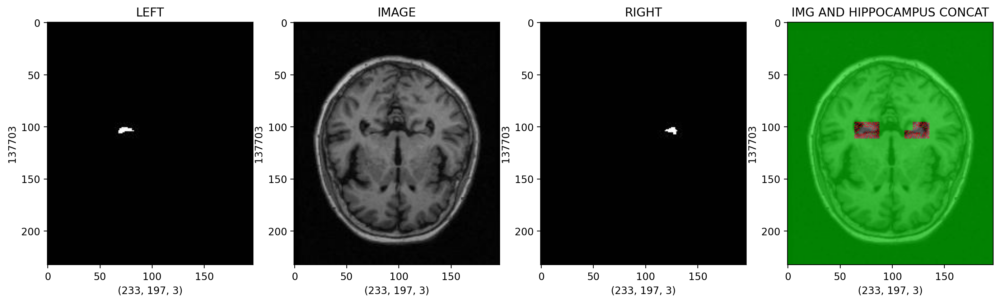

In [28]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1010]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1010]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1010]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Copy_Main = Example_IMG.copy()
Copy_Main[Hıppocampus_Concat[:,:,0] == 1] = [255,0,0] # Hıppocampus_Concat을 만들 때, 왼쪽 이미지와 오른쪽 이미지를 합쳤는데 
Copy_Main[Hıppocampus_Concat[:,:,0] == 2] = [0,255,0] # 이 때 레이블이 같은 부분은 더한 결과가 2가 되고, 레이블이 다른 부분은 더한 결과가 1이 되도록 했습니다.
    
Copy_Main_Two = Example_IMG.copy()
Blend_Image = cv2.addWeighted(Copy_Main,0.5,Copy_Main_Two,0.5,0,Copy_Main_Two)


axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Blend_Image.shape)
axis[3].set_ylabel(Blend_Image.size)
axis[3].set_title("IMG AND HIPPOCAMPUS CONCAT")
axis[3].imshow(Blend_Image)

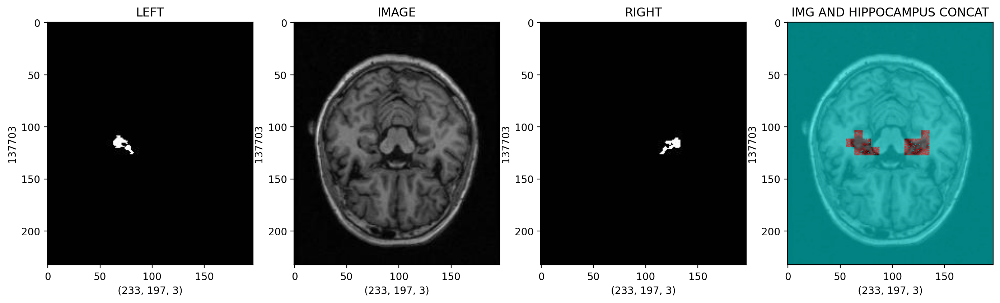

In [29]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1000]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1000]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1000]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Copy_Main = Example_IMG.copy()
Copy_Main[Hıppocampus_Concat[:,:,0] == 1] = [255,0,0]
Copy_Main[Hıppocampus_Concat[:,:,0] == 2] = [0,255,255]
    
Copy_Main_Two = Example_IMG.copy()
Blend_Image = cv2.addWeighted(Copy_Main,0.5,Copy_Main_Two,0.5,0,Copy_Main_Two) # 0: 화면 밝기 조정 값. 0이면 화면이 그대로 유지됩니다. Copy_Main_Two: 결과 이미지를 저장할 변수입니다.


axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Blend_Image.shape)
axis[3].set_ylabel(Blend_Image.size)
axis[3].set_title("IMG AND HIPPOCAMPUS CONCAT")
axis[3].imshow(Blend_Image)

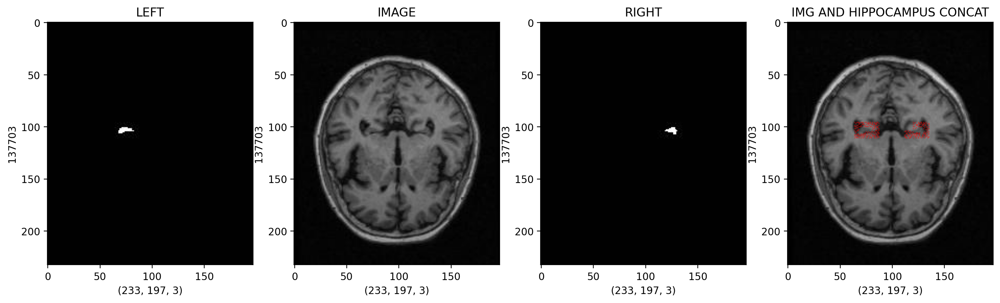

In [30]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1010]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1010]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1010]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Copy_Main = Example_IMG.copy()
Copy_Main[Hıppocampus_Concat[:,:,0] == 1] = [255,0,0]
    
Copy_Main_Two = Example_IMG.copy()
Blend_Image = cv2.addWeighted(Copy_Main,0.5,Copy_Main_Two,0.5,0,Copy_Main_Two)


axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Blend_Image.shape)
axis[3].set_ylabel(Blend_Image.size)
axis[3].set_title("IMG AND HIPPOCAMPUS CONCAT")
axis[3].imshow(Blend_Image)

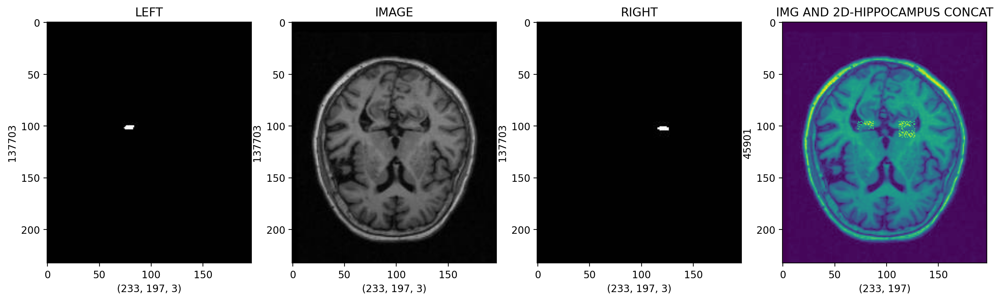

In [31]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1015]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1015]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1015]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Copy_Main = Example_IMG.copy()
Copy_Main[Hıppocampus_Concat[:,:,0] == 1] = [255,0,0]
    
Copy_Main_Two = Example_IMG.copy()
Blend_Image = cv2.addWeighted(Copy_Main,0.5,Copy_Main_Two,0.5,0,Copy_Main_Two)


axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Blend_Image[:,:,0].shape)
axis[3].set_ylabel(Blend_Image[:,:,0].size)
axis[3].set_title("IMG AND 2D-HIPPOCAMPUS CONCAT")
axis[3].imshow(Blend_Image[:,:,0])
# Blend_Image[:,:,0]에서는 Copy_Main과 Copy_Main_Two의 R(Red) 채널 값이 합쳐진 결과가 나오게 되는데,
# 노란색(빨강+녹색)과 파란색이 합쳐져서 보라색(빨강+파랑)으로 나오게 됩니다.

THRESHOLD-CANNY-DRAWING

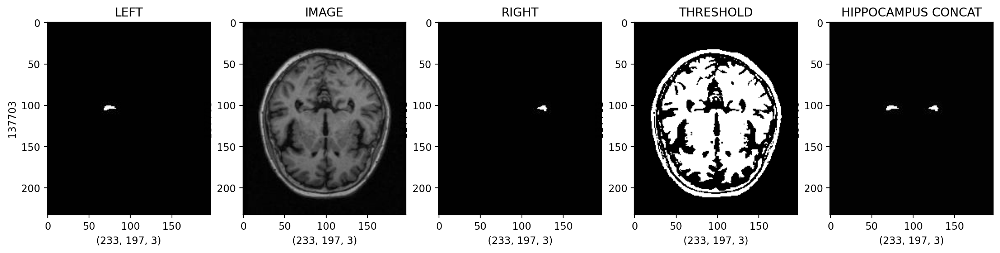

In [32]:
figure,axis = plt.subplots(1,5,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1010]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1010]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1010]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
# cv2.threshold() 함수를 이용해 Example_IMG 이미지를 70의 Threshold 값으로 이진화하였습니다.
# 즉, Example_IMG 이미지에서 픽셀의 밝기 값이 70보다 크면 255(흰색), 작으면 0(검은색)으로 처리되어 Threshold_IMG 이미지가 생성됩니다.

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Hıppocampus_Concat.shape)
axis[4].set_ylabel(Hıppocampus_Concat.size)
axis[4].set_title("HIPPOCAMPUS CONCAT")
axis[4].imshow(Hıppocampus_Concat)

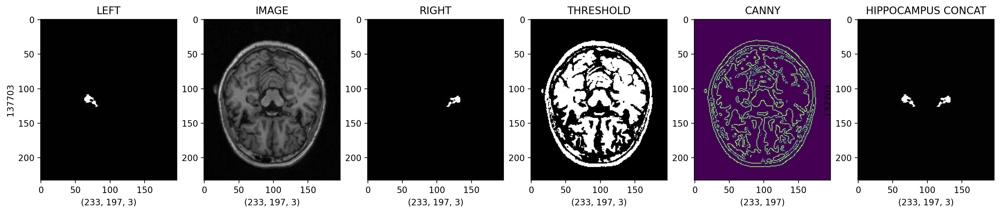

In [33]:
figure,axis = plt.subplots(1,6,figsize=(20,20))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1000]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1000]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1000]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
# cv2.Canny() 함수는 이미지에서 경계선을 검출하기 위해 사용되는 에지 검출 알고리즘 중 하나입니다.
# Canny 알고리즘은 노이즈 제거, 경계 검출, 비최대치 억제, 히스테리시스 임계값 처리 등의 단계로 구성됩니다.
# 이 함수는 3개의 매개변수를 입력받습니다.
# img: 에지 검출을 수행할 이미지 (grayscale 이미지)
# threshold1: 에지를 검출하기 위한 하위 임계값
# threshold2: 에지를 검출하기 위한 상위 임계값

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Hıppocampus_Concat.shape)
axis[5].set_ylabel(Hıppocampus_Concat.size)
axis[5].set_title("HIPPOCAMPUS CONCAT")
axis[5].imshow(Hıppocampus_Concat)

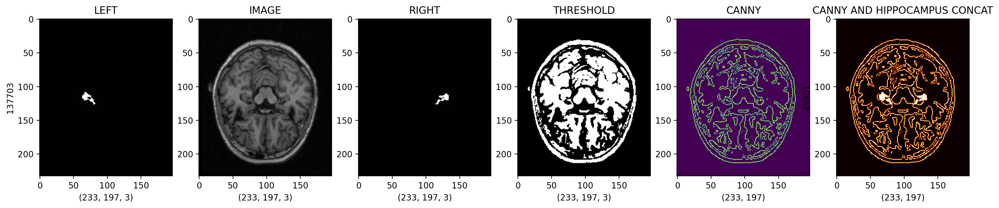

In [34]:
figure,axis = plt.subplots(1,6,figsize=(20,20))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1000]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1000]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1000]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
Canny_Hıppocampus_Concat = cv2.addWeighted(Canny_IMG,1,Hıppocampus_Concat[:,:,0],1,0.2)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat,cmap="hot")

KEYPOINTS

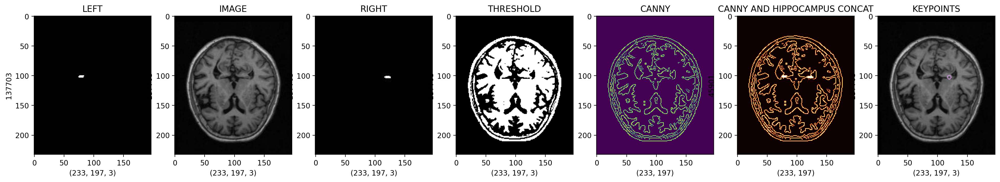

In [35]:
figure,axis = plt.subplots(1,7,figsize=(24,24))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1015]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1015]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1015]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
Canny_Hıppocampus_Concat = cv2.addWeighted(Canny_IMG,1,Hıppocampus_Concat[:,:,0],1,0.2)

Sift_Func = cv2.SIFT_create() # SIFT 객체를 생성합니다.
Keypoints,Descript = Sift_Func.detectAndCompute(Hıppocampus_Concat,None) # 이미지에서 키포인트와 디스크립터를 추출합니다. 여기서는 Hıppocampus_Concat 이미지에서 추출하도록 지정하였습니다.
Keypoints_Out = cv2.drawKeypoints(Example_IMG,Keypoints,Canny_Hıppocampus_Concat) # 추출된 키포인트를 이미지에 그리는 함수입니다. 여기서는 Example_IMG 이미지에 추출된 키포인트를 그리도록 지정하였습니다.

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat,cmap="hot")

axis[6].set_xlabel(Keypoints_Out.shape)
axis[6].set_ylabel(Keypoints_Out.size)
axis[6].set_title("KEYPOINTS")
axis[6].imshow(Keypoints_Out)

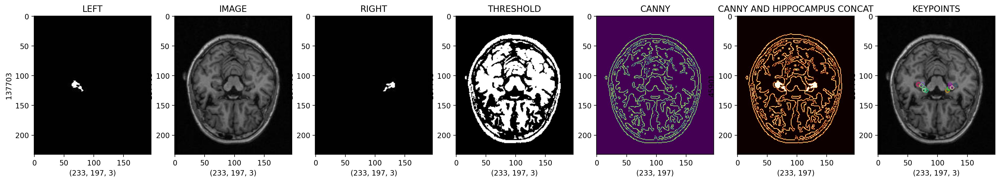

In [36]:
figure,axis = plt.subplots(1,7,figsize=(24,24))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1000]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1000]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1000]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
Canny_Hıppocampus_Concat = cv2.addWeighted(Canny_IMG,1,Hıppocampus_Concat[:,:,0],1,0.2)

Sift_Func = cv2.SIFT_create()
Keypoints,Descript = Sift_Func.detectAndCompute(Hıppocampus_Concat,None)
Keypoints_Out = cv2.drawKeypoints(Example_IMG,Keypoints,Canny_Hıppocampus_Concat)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat,cmap="hot")

axis[6].set_xlabel(Keypoints_Out.shape)
axis[6].set_ylabel(Keypoints_Out.size)
axis[6].set_title("KEYPOINTS")
axis[6].imshow(Keypoints_Out)

KEYPOINTS OVERVIEW

In [37]:
print(Keypoints)
print("---"*10)
print(Keypoints[0].angle)
print(Keypoints[1].angle)
print(Keypoints[2].angle)
print(Keypoints[3].angle)
print(Keypoints[4].angle)

(< cv2.KeyPoint 0x7fe3036d0a50>, < cv2.KeyPoint 0x7fe3036d0a80>, < cv2.KeyPoint 0x7fe2fe202b70>, < cv2.KeyPoint 0x7fe2fe1e3b10>, < cv2.KeyPoint 0x7fe2fe1e3b40>, < cv2.KeyPoint 0x7fe2fe1e3ae0>, < cv2.KeyPoint 0x7fe301d83fc0>, < cv2.KeyPoint 0x7fe301db5c90>, < cv2.KeyPoint 0x7fe301d96d80>, < cv2.KeyPoint 0x7fe301d96ab0>, < cv2.KeyPoint 0x7fe301d96c00>, < cv2.KeyPoint 0x7fe301d96c30>, < cv2.KeyPoint 0x7fe301d96c60>, < cv2.KeyPoint 0x7fe301dacbd0>, < cv2.KeyPoint 0x7fe301dacc00>, < cv2.KeyPoint 0x7fe301dacc30>, < cv2.KeyPoint 0x7fe301dacc60>)
------------------------------
30.9088134765625
135.62112426757812
283.8036804199219
268.4611511230469
123.87861633300781


In [38]:
print("octave: ",Keypoints[0].octave)
print("class_id: ",Keypoints[0].class_id)
print("pt: ",Keypoints[0].pt)
print("response: ",Keypoints[0].response)
print("size: ",Keypoints[0].size)

octave:  13304576
class_id:  -1
pt:  (67.83229064941406, 114.94896697998047)
response:  0.14317579567432404
size:  6.855664253234863


HESSIAN

Hessian 행렬은 이미지에서 변화율의 크기와 방향을 나타내는 행렬로, 이미지에서의 곡률과 에지 방향 정보를 제공합니다.  
이를 활용하여 이미지에서의 블롭(Blob) 검출, 특징 추출 등 다양한 컴퓨터 비전 분야에서 활용됩니다.

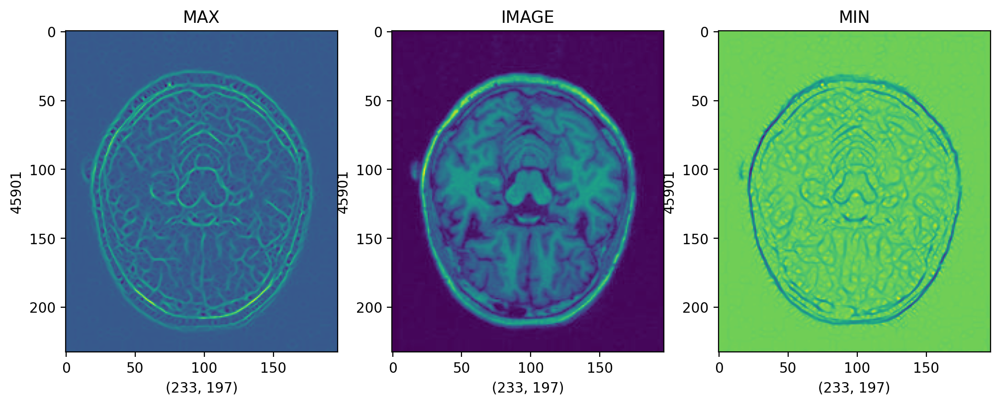

In [39]:
figure,axis = plt.subplots(1,3,figsize=(12,12))

Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1000]),cv2.COLOR_BGR2GRAY)
Hessian_IMG = hessian_matrix(Example_IMG,sigma=0.5,order="rc")
Max_IMG,Min_IMG = hessian_matrix_eigvals(Hessian_IMG)



axis[0].set_xlabel(Max_IMG.shape)
axis[0].set_ylabel(Max_IMG.size)
axis[0].set_title("MAX")
axis[0].imshow(Max_IMG)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Min_IMG.shape)
axis[2].set_ylabel(Min_IMG.size)
axis[2].set_title("MIN")
axis[2].imshow(Min_IMG)

SKELETON HIPPOCAMPUS

"Skeleton hippocampus"는 해부학적으로 쥐나 사람의 뇌에서 발견되는 해마(hippocampus) 영역에서 세포들이 결손되어 생긴 형태를 말합니다.  
이러한 결손 현상은 해마 영역에서의 뇌병변과 연관이 있을 수 있으며, 뇌졸중, 질병, 손상 등 다양한 원인으로 인해 발생할 수 있습니다.  
해마는 기억, 공간 인식, 학습 등에 관여하며, 이러한 기능들이 손상되면 기억력 저하, 공간인식 장애 등의 증상이 나타날 수 있습니다.  
따라서 해마의 건강 상태를 파악하는 것은 중요한 의학적 연구 분야 중 하나입니다.

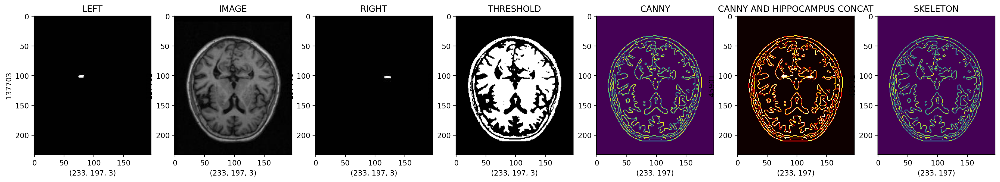

In [40]:
figure,axis = plt.subplots(1,7,figsize=(24,24))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1015]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1015]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1015]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
Canny_Hıppocampus_Concat = cv2.addWeighted(Canny_IMG,1,Hıppocampus_Concat[:,:,0],1,0.2)
_,Threshold_Blend = cv2.threshold(Canny_Hıppocampus_Concat,100,255,cv2.THRESH_TOZERO_INV)

Array_IMG = np.array(Canny_Hıppocampus_Concat > Threshold_Blend).astype(int)
Skeleton_IMG = skimage.morphology.skeletonize(Array_IMG)
# 주어진 이미지를 이진화한 후, threshold 값보다 큰 값을 1, 작은 값을 0으로 처리하여 이진 배열로 변환합니다.
# 그 후, 이진 배열에 대해 skimage 라이브러리의 morphology 모듈을 사용하여 skeletonize(골격화) 작업을 수행합니다. 
# 이를 통해 이진 배열 내에서 픽셀 사이의 모든 연결성이 유지되면서 픽셀들이 최대한 얇아지도록 변환됩니다. 
# 이를 통해 보다 간단하고 효과적인 형태의 이미지를 얻을 수 있습니다.

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat,cmap="hot")

axis[6].set_xlabel(Skeleton_IMG.shape)
axis[6].set_ylabel(Skeleton_IMG.size)
axis[6].set_title("SKELETON")
axis[6].imshow(Skeleton_IMG)

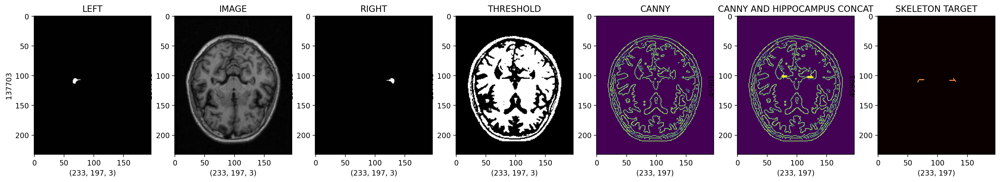

In [41]:
figure,axis = plt.subplots(1,7,figsize=(24,24))

Example_L = cv2.cvtColor(cv2.imread(Sort_L[1005]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sort_R[1005]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sort_IMG[1005]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

_,Threshold_Blend = cv2.threshold(Hıppocampus_Concat[:,:,0],100,255,cv2.THRESH_TOZERO_INV)
Array_IMG = np.array(Hıppocampus_Concat[:,:,0] > Threshold_Blend).astype(int)
Skeleton_IMG = skimage.morphology.skeletonize(Array_IMG)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat)

axis[6].set_xlabel(Skeleton_IMG.shape)
axis[6].set_ylabel(Skeleton_IMG.size)
axis[6].set_title("SKELETON TARGET")
axis[6].imshow(Skeleton_IMG,cmap="hot")

# DATA PROCESS

TRANSFORMATION I

In [42]:
X_Image = []
X_Hippocampus = []

for x_image,x_l,x_r in zip(Sort_IMG,Sort_L,Sort_R):
    
    Picking_L = cv2.cvtColor(cv2.imread(x_l),cv2.COLOR_BGR2RGB)
    Picking_R = cv2.cvtColor(cv2.imread(x_r),cv2.COLOR_BGR2RGB)
    Picking_IMG = cv2.cvtColor(cv2.imread(x_image),cv2.COLOR_BGR2RGB)
    Hıppocampus_Concat = cv2.addWeighted(Picking_L,1,Picking_R,1,0.2)
    _,Threshold_IMG = cv2.threshold(Picking_IMG,70,255,cv2.THRESH_BINARY)
    Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
    Canny_Hıppocampus_Concat = cv2.addWeighted(Canny_IMG,1,Hıppocampus_Concat[:,:,0],1,0.2)
    
    Picking_IMG = Picking_IMG / 255.
    Canny_Hıppocampus_Concat = Canny_Hıppocampus_Concat / 255.
    
    X_Image.append(Picking_IMG)
    X_Hippocampus.append(Canny_Hıppocampus_Concat)

In [43]:
print("ARRAY IMAGE SHAPE: ",np.shape(np.array(X_Image)))
print("ARRAY HIPPOCAMPUS SHAPE: ",np.shape(np.array(X_Hippocampus)))

ARRAY IMAGE SHAPE:  (3213, 233, 197, 3)
ARRAY HIPPOCAMPUS SHAPE:  (3213, 233, 197)


Text(0.5, 1.0, 'TRANSFORMATION')

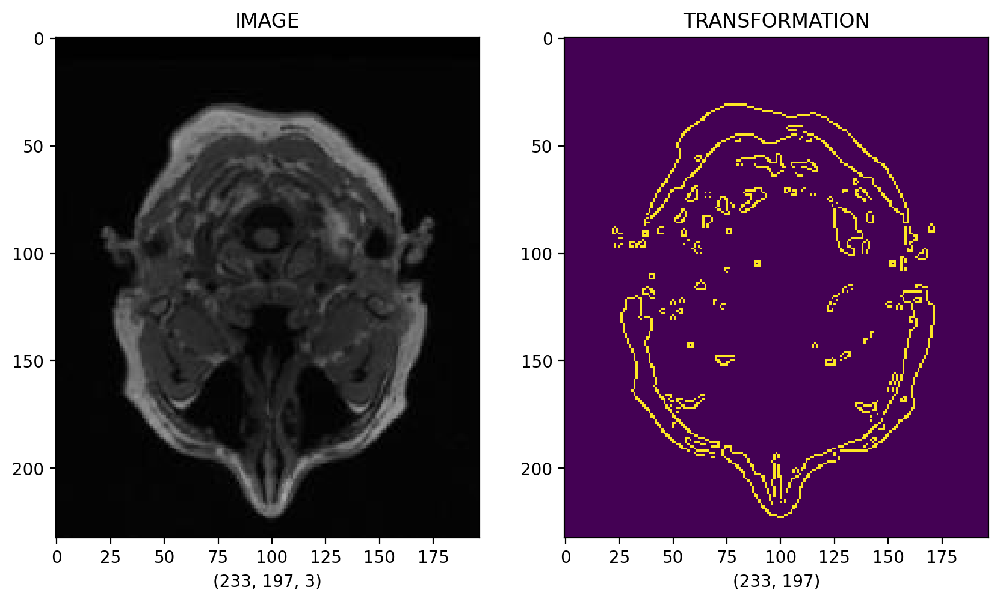

In [44]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(X_Image[10])
axis[0].set_xlabel(X_Image[10].shape)
axis[0].set_title("IMAGE")
axis[1].imshow(X_Hippocampus[10])
axis[1].set_xlabel(X_Hippocampus[10].shape)
axis[1].set_title("TRANSFORMATION")

Text(0.5, 1.0, 'TRANSFORMATION')

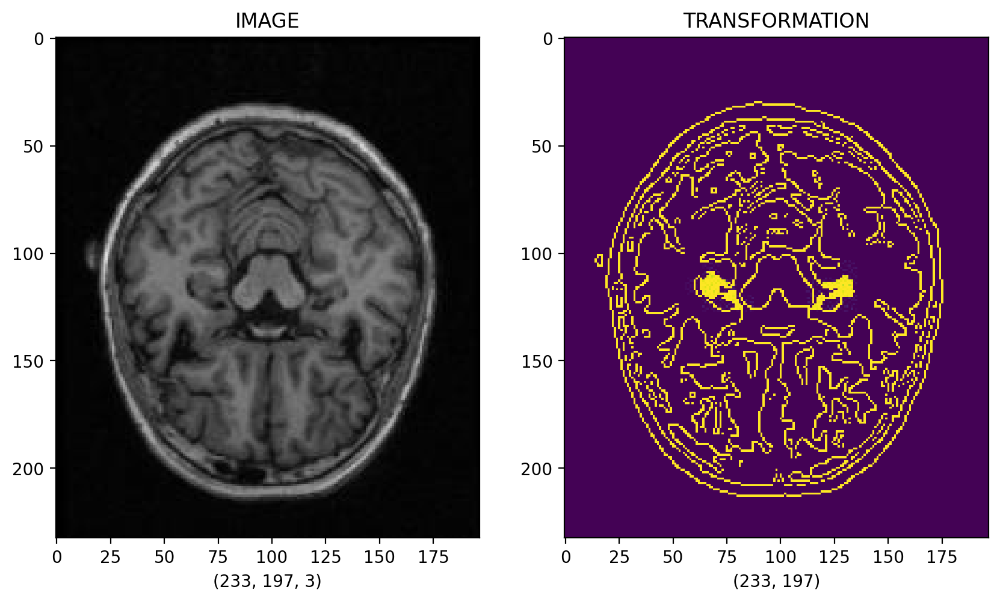

In [45]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(X_Image[1000])
axis[0].set_xlabel(X_Image[1000].shape)
axis[0].set_title("IMAGE")
axis[1].imshow(X_Hippocampus[1000])
axis[1].set_xlabel(X_Hippocampus[1000].shape)
axis[1].set_title("TRANSFORMATION")

TRANSFORMATION II

In [46]:
Image_New = []
Hippocampus_Mask = []

for x_image,x_l,x_r in zip(Sort_IMG[:1500],Sort_L[:1500],Sort_R[:1500]):
    
    Picking_L = cv2.cvtColor(cv2.imread(x_l),cv2.COLOR_BGR2RGB)
    Picking_R = cv2.cvtColor(cv2.imread(x_r),cv2.COLOR_BGR2RGB)
    Picking_IMG = cv2.cvtColor(cv2.imread(x_image),cv2.COLOR_BGR2RGB)
    Hıppocampus_Concat = cv2.addWeighted(Picking_L,1,Picking_R,1,0.2)
    
    Picking_IMG = Picking_IMG / 255.
    Hıppocampus_Concat = Hıppocampus_Concat / 255.
    
    Image_New.append(Picking_IMG)
    Hippocampus_Mask.append(Hıppocampus_Concat)

In [47]:
print("ARRAY IMAGE SHAPE: ",np.shape(np.array(Image_New)))
print("ARRAY HIPPOCAMPUS SHAPE: ",np.shape(np.array(Hippocampus_Mask)))

ARRAY IMAGE SHAPE:  (1500, 233, 197, 3)
ARRAY HIPPOCAMPUS SHAPE:  (1500, 233, 197, 3)


TO ARRAY

In [48]:
Image_Array = np.array(X_Image,dtype="float32")
Hippocampus_Array = np.array(X_Hippocampus,dtype="float32")

In [49]:
Image_New = np.array(Image_New,dtype="float32")
Hippocampus_Mask = np.array(Hippocampus_Mask,dtype="float32")

In [50]:
print(type(Image_Array))
print(type(Hippocampus_Array))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [51]:
print(Image_Array[0].dtype)
print(Hippocampus_Array[0].dtype)

float32
float32


# MODEL I

In [52]:
Encoder_G = Sequential()
Encoder_G.add(Conv2D(32,(2,2),kernel_initializer = 'he_normal'))
Encoder_G.add(BatchNormalization())
Encoder_G.add(ReLU())
#
Encoder_G.add(Conv2D(64,(2,2),kernel_initializer = 'he_normal'))
Encoder_G.add(BatchNormalization())
Encoder_G.add(ReLU())
#
Encoder_G.add(Conv2D(128,(2,2),kernel_initializer = 'he_normal'))
Encoder_G.add(BatchNormalization())
Encoder_G.add(ReLU())


Decoder_G = Sequential()
Decoder_G.add(Conv2DTranspose(64,(2,2)))
Decoder_G.add(ReLU())
#
Decoder_G.add(Conv2DTranspose(32,(2,2)))
Decoder_G.add(ReLU())
#
Decoder_G.add(Conv2DTranspose(1,(2,2)))
Decoder_G.add(ReLU())

Auto_Encoder = Sequential([Encoder_G,Decoder_G])

2023-05-02 02:14:19.112525: I tensorflow/core/platform/cpu_feature_guard.cc:194] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE3 SSE4.1 SSE4.2 AVX
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-02 02:14:19.629664: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1553] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 14445 MB memory:  -> device: 0, name: CUDA GPU, pci bus id: 0000:be:00.0, compute capability: 7.0


Encoder_G는 인코더 네트워크를 구현합니다. 여러 개의 합성곱(Conv2D) 레이어를 통해 입력 이미지를 다운샘플링합니다. BatchNormalization과 ReLU(activation function) 레이어도 함께 사용됩니다. 더 작은 차원의 특징맵(feature map)을 생성하면서 입력 이미지를 압축합니다.

Decoder_G는 디코더 네트워크를 구현합니다. 인코더 네트워크와 반대로 Conv2DTranspose 레이어를 사용하여 입력 이미지를 업샘플링합니다. 이를 통해 원래 크기의 이미지를 복원합니다.

U-Net 모델과 유사하지만, 간단한 Encoder-Decoder 구조를 사용하여 이미지를 압축하고 다시 복원하는 Autoencoder를 구현하고 있습니다.

In [53]:
Auto_Encoder.compile(loss="binary_crossentropy",optimizer="adam",metrics=["mse"])

In [54]:
Auto_Encoder_Model = Auto_Encoder.fit(Image_Array[:3000],Hippocampus_Array[:3000],epochs=25)

Epoch 1/25


2023-05-02 02:14:24.000659: I tensorflow/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8600


94/94 [==============================] - 14s 114ms/step - loss: 0.2699 - mse: 0.0334
Epoch 2/25
94/94 [==============================] - 10s 104ms/step - loss: 0.1724 - mse: 0.0228
Epoch 3/25
94/94 [==============================] - 10s 104ms/step - loss: 0.1728 - mse: 0.0245
Epoch 4/25
94/94 [==============================] - 10s 103ms/step - loss: 0.1333 - mse: 0.0214
Epoch 5/25
94/94 [==============================] - 10s 103ms/step - loss: 0.1120 - mse: 0.0212
Epoch 6/25
94/94 [==============================] - 10s 103ms/step - loss: 0.1079 - mse: 0.0196
Epoch 7/25
94/94 [==============================] - 10s 103ms/step - loss: 0.1053 - mse: 0.0190
Epoch 8/25
94/94 [==============================] - 10s 104ms/step - loss: 0.1071 - mse: 0.0196
Epoch 9/25
94/94 [==============================] - 10s 103ms/step - loss: 0.1067 - mse: 0.0194
Epoch 10/25
94/94 [==============================] - 10s 103ms/step - loss: 0.1065 - mse: 0.0196
Epoch 11/25
94/94 [==============================]

PREDICTION

In [55]:
Prediction_IMG = Auto_Encoder.predict(Image_Array[:10])

1/1 [==============================] - 0s 243ms/step


Text(0.5, 1.0, 'PREDICTION')

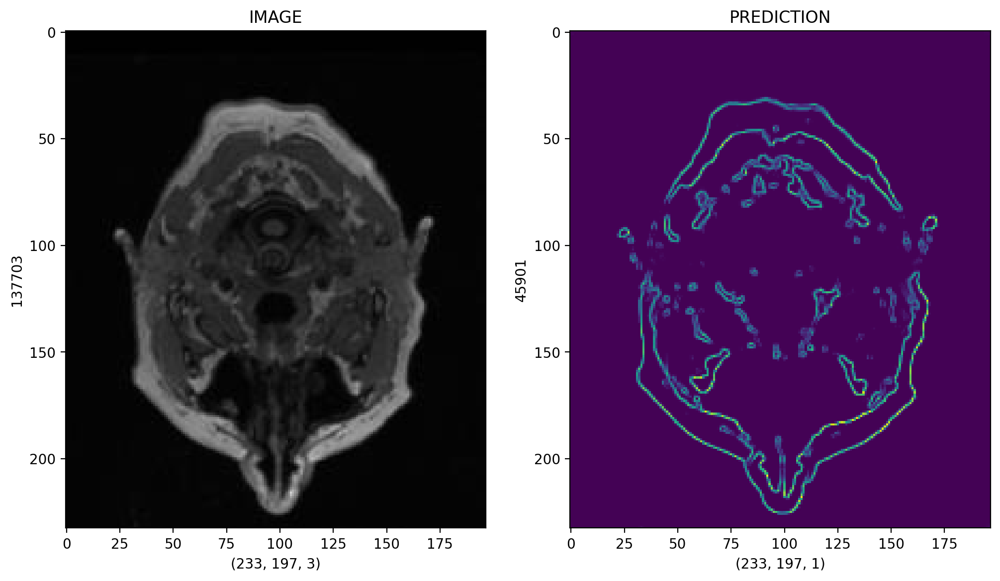

In [56]:
figure,axis = plt.subplots(1,2,figsize=(12,12))
prediction_img_number = 1

Original_Img = Image_Array[prediction_img_number]
Predict_Hippocampus = Prediction_IMG[prediction_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

In [57]:
Prediction_IMG = Auto_Encoder.predict(Image_Array[1000:1021])

1/1 [==============================] - 0s 227ms/step


Text(0.5, 1.0, 'PREDICTION')

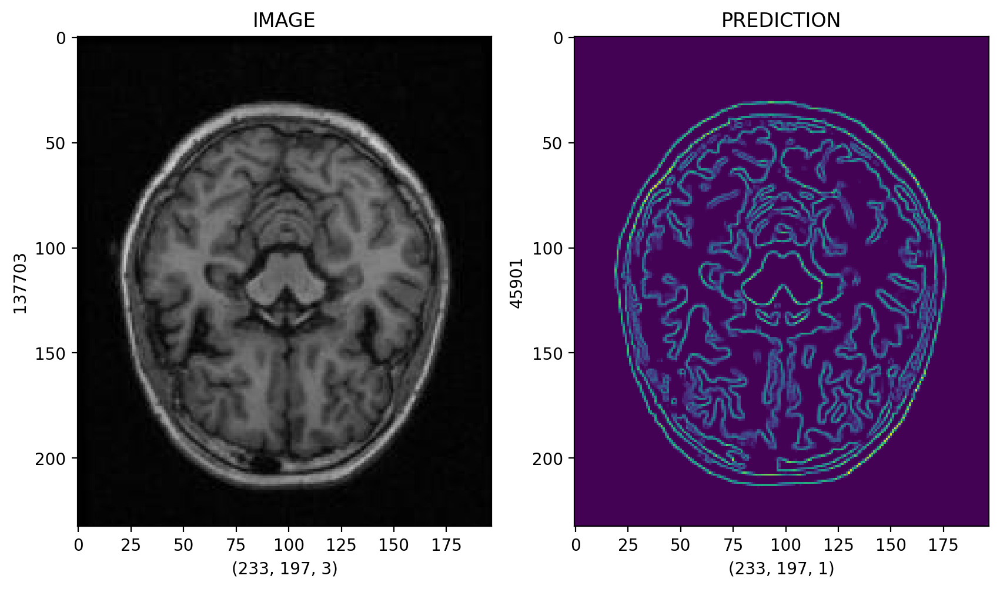

In [58]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Original_Img = Image_Array[1002]
Predict_Hippocampus = Prediction_IMG[2]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

# MODEL II

In [59]:
Encoder_GII = Sequential()
Encoder_GII.add(Conv2D(20,(5,5),kernel_initializer = 'he_normal',use_bias=True))
Encoder_GII.add(BatchNormalization())
Encoder_GII.add(ReLU())
#
Encoder_GII.add(Conv2D(40,(5,5),kernel_initializer = 'he_normal',use_bias=True))
Encoder_GII.add(BatchNormalization())
Encoder_GII.add(ReLU())
#
Encoder_GII.add(Conv2D(120,(5,5),kernel_initializer = 'he_normal',use_bias=True))
Encoder_GII.add(BatchNormalization())
Encoder_GII.add(ReLU())


Decoder_GII = Sequential()
Decoder_GII.add(Conv2DTranspose(40,(5,5)))
Decoder_GII.add(ReLU())
#
Decoder_GII.add(Conv2DTranspose(20,(5,5)))
Decoder_GII.add(ReLU())
#
Decoder_GII.add(Conv2DTranspose(1,(5,5)))
Decoder_GII.add(ReLU())

Auto_Encoder_II = Sequential([Encoder_GII,Decoder_GII])

In [60]:
Auto_Encoder_II.compile(loss="binary_crossentropy",optimizer=Adam(lr=0.000001),metrics=["mse"])

In [61]:
Auto_Encoder_Model_II = Auto_Encoder_II.fit(Image_New[:1100],Hippocampus_Mask[:1100],epochs=25)

Epoch 1/25
35/35 [==============================] - 12s 277ms/step - loss: 0.1611 - mse: 0.0097
Epoch 2/25
35/35 [==============================] - 6s 162ms/step - loss: 0.1472 - mse: 0.0061
Epoch 3/25
35/35 [==============================] - 6s 163ms/step - loss: 0.1413 - mse: 0.0044
Epoch 4/25
35/35 [==============================] - 6s 161ms/step - loss: 0.1386 - mse: 0.0036
Epoch 5/25
35/35 [==============================] - 6s 161ms/step - loss: 0.1367 - mse: 0.0030
Epoch 6/25
35/35 [==============================] - 6s 162ms/step - loss: 0.1353 - mse: 0.0025
Epoch 7/25
35/35 [==============================] - 6s 158ms/step - loss: 0.1345 - mse: 0.0023
Epoch 8/25
35/35 [==============================] - 6s 160ms/step - loss: 0.1339 - mse: 0.0021
Epoch 9/25
35/35 [==============================] - 6s 159ms/step - loss: 0.1334 - mse: 0.0019
Epoch 10/25
35/35 [==============================] - 6s 163ms/step - loss: 0.1329 - mse: 0.0017
Epoch 11/25
35/35 [=============================

PREDICTION

In [62]:
Prediction_IMG_II = Auto_Encoder_II.predict(Image_New[:10])

1/1 [==============================] - 0s 405ms/step


Text(0.5, 1.0, 'PREDICTION')

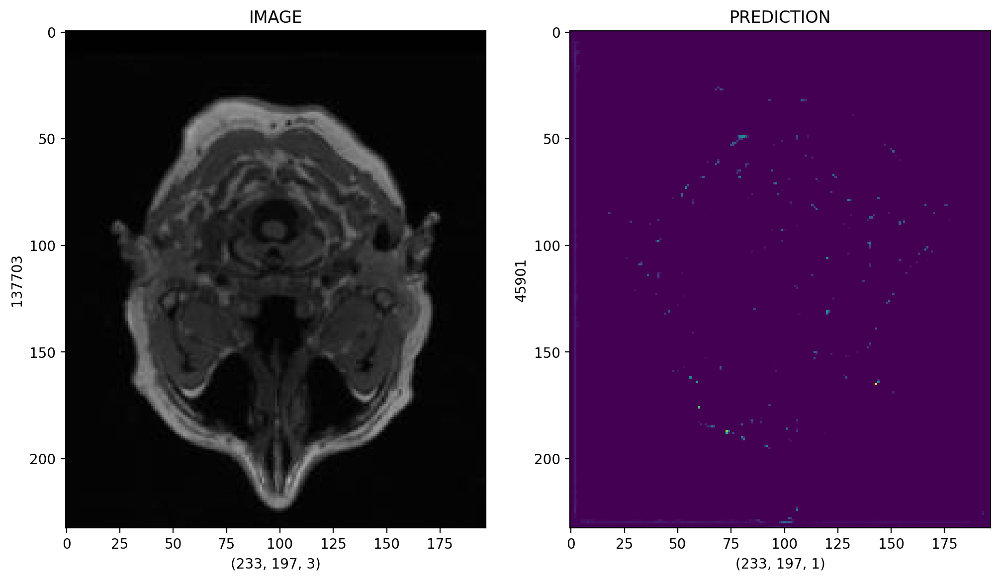

In [63]:
figure,axis = plt.subplots(1,2,figsize=(12,12))
prediction_img_number = 8

Original_Img = Image_New[prediction_img_number]
Predict_Hippocampus = Prediction_IMG_II[prediction_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

In [64]:
Prediction_IMG_Non_Seen = Auto_Encoder_II.predict(Image_New[1000:1021])

1/1 [==============================] - 1s 511ms/step


Text(0.5, 1.0, 'PREDICTION')

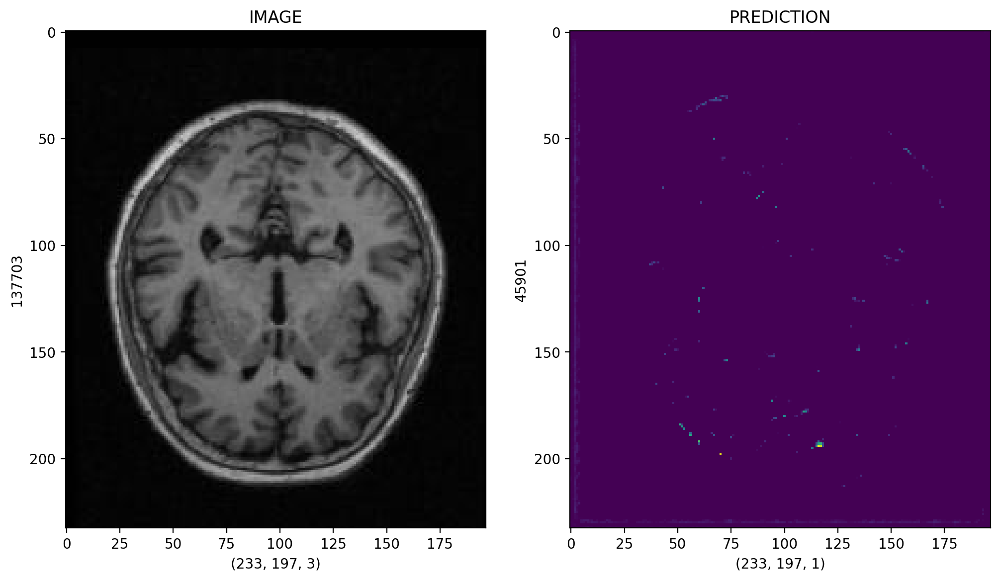

In [65]:
figure,axis = plt.subplots(1,2,figsize=(12,12))

Original_Img = Image_New[1011]
Predict_Hippocampus = Prediction_IMG_Non_Seen[11]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")